## Goal: Replicate Figures from Chapter 1

In [1]:
using Distributions
using Images
using LinearAlgebra
using MosaicViews
using MAT
using Plots
using Statistics

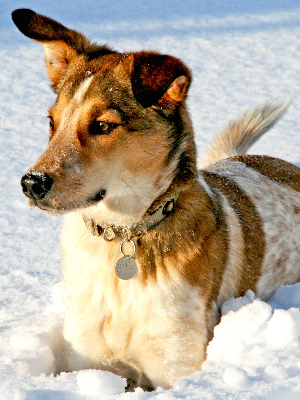

In [249]:
fullimg = load("../DATA/dog.jpg")
img = fullimg[1:5:end,1:5:end] # Reduce image size for easier viewing

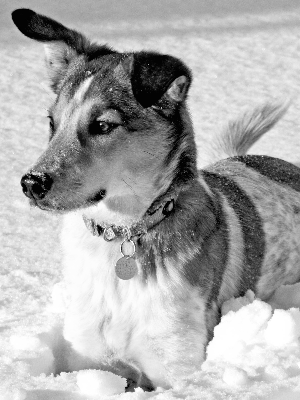

In [250]:
greyimg = Gray.(img)

In [251]:
size(greyimg)

(400, 300)

### Now, we wish to use the SVD to truncate the image with reduced dimensions 5, 20, 100, 200 when the original image is of dimension 400x300

Reduced images by SVD with r = [5, 20, 100, 200]


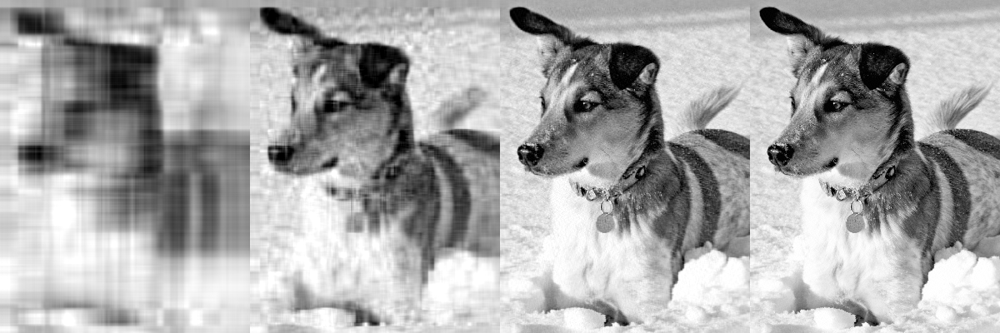

In [252]:
U,Σ,V = svd(greyimg);
rs = [5,20,100,200]
imgs = [U[:,1:r] * Diagonal(Σ[1:r]) * V[:,1:r]' .|> Gray for r in rs]
println("Reduced images by SVD with r = $(rs)")
mosaicview(imgs..., nrow=1)

### Visualize the decay of the singular values

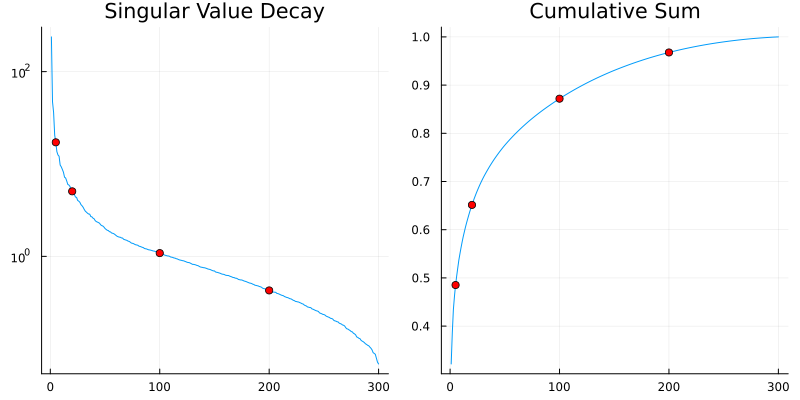

In [253]:
plot(
    begin
        plot(Σ, yaxis=:log, label=false, title="Singular Value Decay")
        scatter!(rs, Σ[rs], label=false, c="red")
    end,
    begin
        plot(cumsum(Σ) ./ sum(Σ), label=false, title="Cumulative Sum")
        scatter!(rs, (cumsum(Σ) ./ sum(Σ))[rs], label=false, c="red")
    end,
    size=(800,400)
)

### Faces Dataset

In [254]:
allFaces_data = matread("../DATA/allFaces.mat")

Dict{String, Any} with 6 entries:
  "faces"  => [80.0 94.0 … 4.0 4.0; 81.0 87.0 … 4.0 3.0; … ; 14.0 9.0 … 1.0 0.0…
  "m"      => 168.0
  "sub"    => Dict{String, Any}("faces"=>[70.0 84.0 … 4.0 4.0; 74.0 83.0 … 4.0 …
  "nfaces" => [64.0 62.0 … 64.0 64.0]
  "person" => 38.0
  "n"      => 192.0

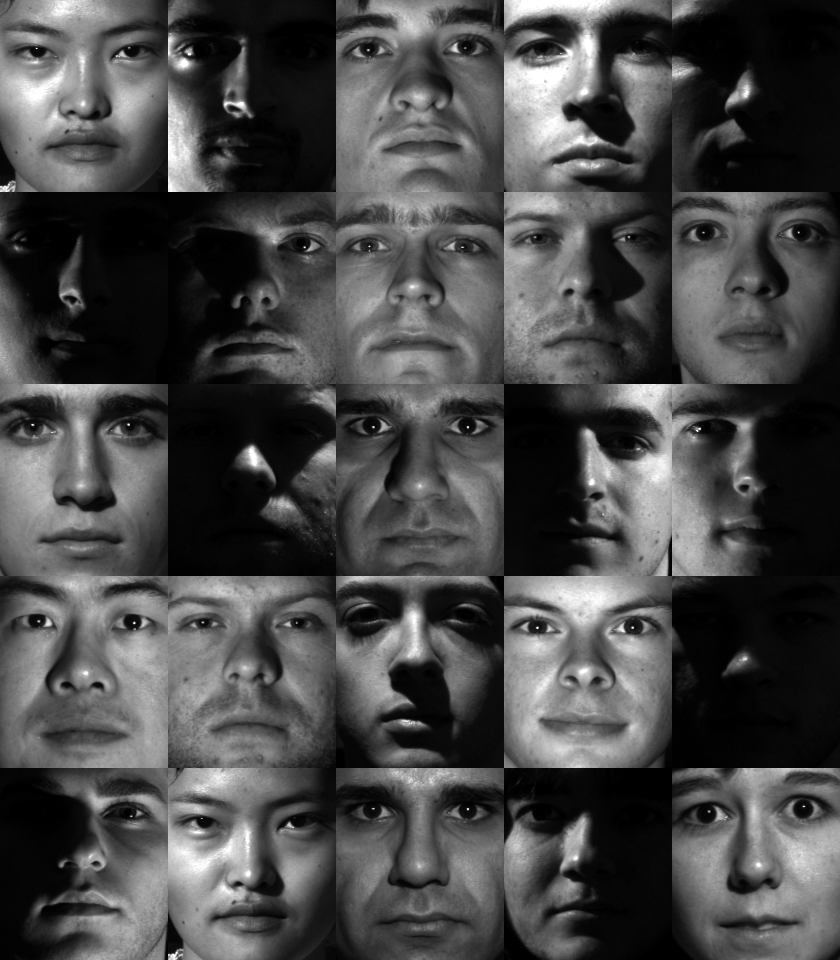

In [257]:
m = Int(allFaces_data["m"])
n = Int(allFaces_data["n"])
facesPer = Int.(allFaces_data["nfaces"][1,:])
faces = allFaces_data["faces"] ./ 255 # Values from 0-255 instead of 0-1
function toImage(faceVector)
    # Each column a face
    return reshape(faceVector,(n,m)) .|> Gray
end
mosaicview([toImage(faces[:,rand(1:sum(face_per))]) for i in 1:25]..., nrow=5)

### Perform PCA on the first 36 members of dataset

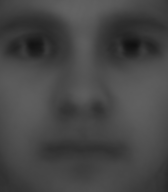

In [258]:
imgData = faces[:,1:sum(face_per[1:36])]
meanFace = mean(imgData, dims=2)[:,1]
toImage(meanFace)

### Perform PCA by subtracting mean and computing SVD

In [260]:
X = imgdata .- mean_face
@time U,Σ,V = svd(X);

### Test PCA on first face of person 37 and 38

PCA Images for r = [1, 25, 50, 100, 200, 400, 800, 1600]


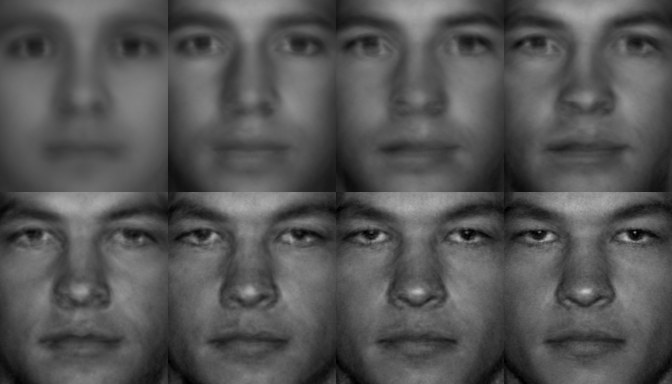

In [261]:
rs = [1,25,50,100,200,400,800,1600]
testFace = faces[:,sum(faces_per[1:36])+1]
# Compute a reduced face by subtracting mean face, projecting onto cols of U, adding back mean face
reducedFace(r) = meanFace .+ U[:,1:r] * U[:,1:r]' * (testFace .- meanFace)
println("PCA Images for r = $(rs)")
mosaicview([toImage(reducedFace(r)) for r in rs]..., nrow=2, rowmajor=true)

PCA Images for r = [1, 25, 50, 100, 200, 400, 800, 1600]


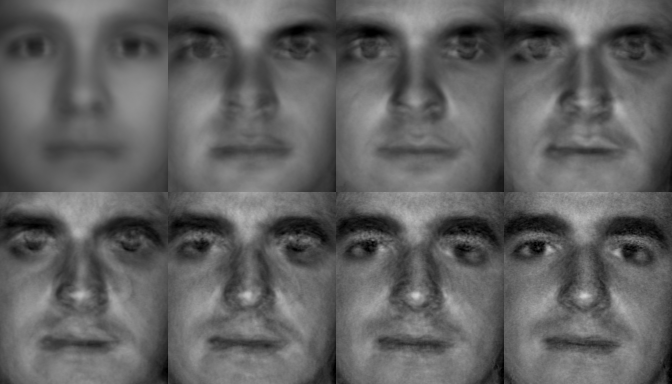

In [262]:
testFace = faces[:,sum(faces_per[1:37])+1]
println("PCA Images for r = $(rs)")
mosaicview([toImage(reducedFace(r)) for r in rs]..., nrow=2, rowmajor=true)

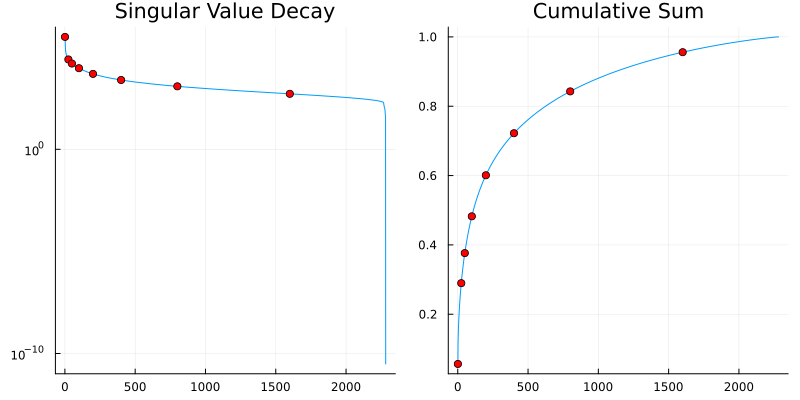

In [263]:
plot(
    begin
        plot(Σ, yaxis=:log, label=false, title="Singular Value Decay")
        scatter!(rs, Σ[rs], label=false, c="red")
    end,
    begin
        plot(cumsum(Σ) ./ sum(Σ), label=false, title="Cumulative Sum")
        scatter!(rs, (cumsum(Σ) ./ sum(Σ))[rs], label=false, c="red")
    end,
    size=(800,400)
)

### Can try to project dog image on to eigenfaces example as well

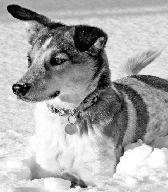

In [264]:
# Resample dog to be the size of the face images
dog = greyimg[floor.(Int,range(1,size(greyimg,1),n)),floor.(Int,range(1,size(greyimg,2),m))]

PCA Images for r = [1, 25, 50, 100, 200, 400, 800, 1600, 2000, 2200]


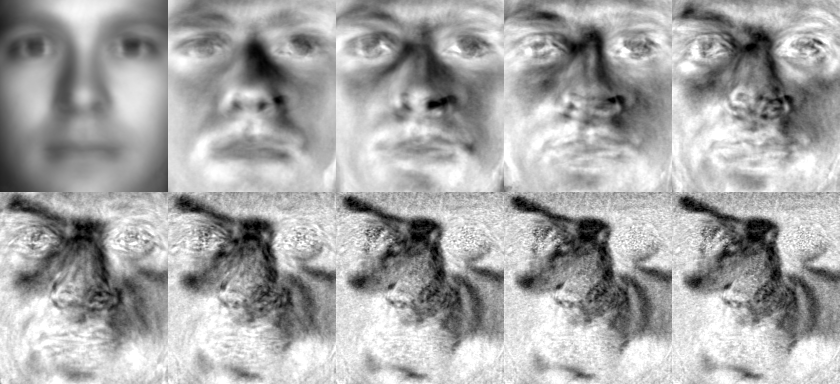

In [266]:
testFace = reshape(Float64.(dog),(length(dog,)))
# Compute a reduced face by subtracting mean face, projecting onto cols of U, adding back mean face
rs = [1,25,50,100,200,400,800,1600,2000,2200]
reducedFace(r) = meanFace .+ U[:,1:r] * U[:,1:r]' * (testFace .- meanFace)
println("PCA Images for r = $(rs)")
mosaicview([toImage(reducedFace(r)) for r in rs]..., nrow=2, rowmajor=true)

### Exercise 1-4 - Singular Values of Gaussian Matrix

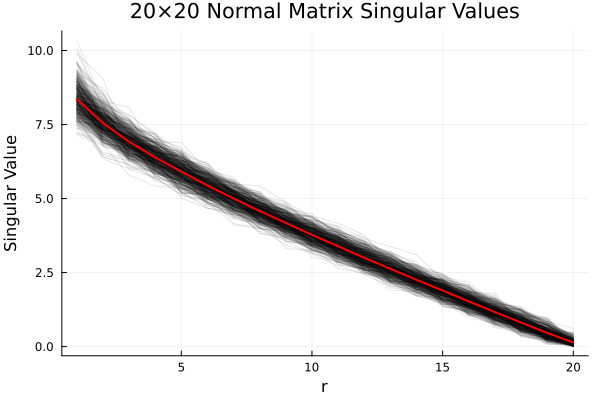

In [2]:
N = Normal(0,1)
matsize=20
reps=500
Svals = zeros(matsize,reps)
plot(xlabel="r", ylabel="Singular Value", title="$(matsize)×$(matsize) Normal Matrix Singular Values")
for i in 1:reps
    randM = rand(N, (matsize,matsize))
    _,S,_ = svd(randM)
    plot!(S, label=false, c="black", alpha=0.1)
    Svals[:,i] .= S
end
meanS = mean(Svals, dims=2)[:,1]
plot!(meanS, label=false, c="red", lw=2)

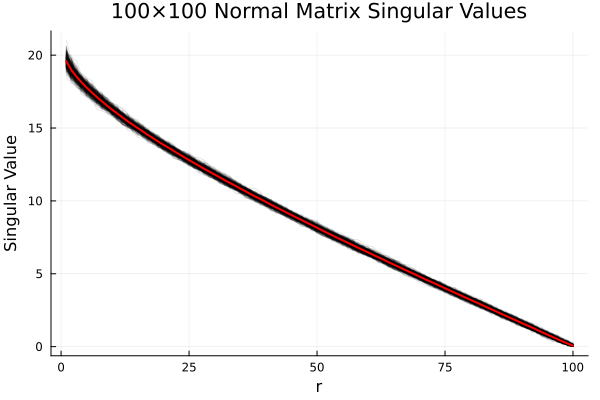

In [23]:
matsize=100
Svals = zeros(matsize,reps)
plot(xlabel="r", ylabel="Singular Value", title="$(matsize)×$(matsize) Normal Matrix Singular Values")
for i in 1:reps
    randM = rand(N, (matsize,matsize))
    _,S,_ = svd(randM)
    plot!(S, label=false, c="black", alpha=0.1)
    Svals[:,i] .= S
end
meanS = mean(Svals, dims=2)[:,1]
plot!(meanS, label=false, c="red", lw=2)

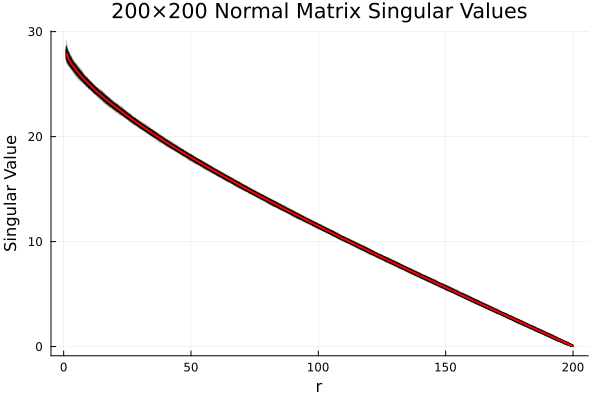

In [27]:
matsize=200
Svals = zeros(matsize,reps)
plot(xlabel="r", ylabel="Singular Value", title="$(matsize)×$(matsize) Normal Matrix Singular Values")
for i in 1:reps
    randM = rand(N, (matsize,matsize))
    _,S,_ = svd(randM)
    plot!(S, label=false, c="black", alpha=0.1)
    Svals[:,i] .= S
end
meanS = mean(Svals, dims=2)[:,1]
plot!(meanS, label=false, c="red", lw=2)

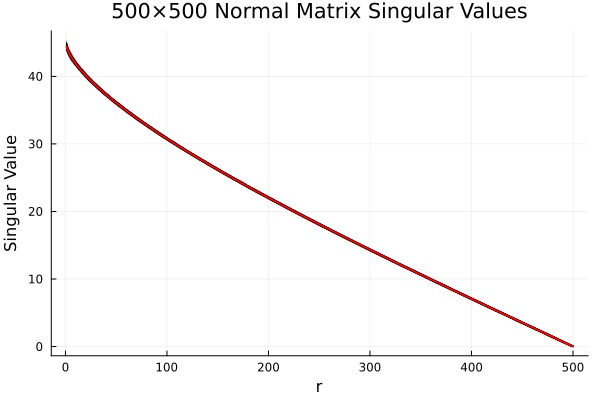

In [28]:
matsize=500
Svals = zeros(matsize,reps)
plot(xlabel="r", ylabel="Singular Value", title="$(matsize)×$(matsize) Normal Matrix Singular Values")
for i in 1:reps
    randM = rand(N, (matsize,matsize))
    _,S,_ = svd(randM)
    plot!(S, label=false, c="black", alpha=0.1)
    Svals[:,i] .= S
end
meanS = mean(Svals, dims=2)[:,1]
plot!(meanS, label=false, c="red", lw=2)